# Grasp and Lift: Weight and Texture Classification using EEG and EMG 

In [1]:
from utils import DataLoader
from Final_Presentation_Notebook_Funcs import calc_averages, return_eeg_emg_averages, plot_emg_diffs, plot_eeg_diffs, organize_NN_results, plot_training_accuracy, plot_training_loss, plot_testing_loss, plot_testing_accuracy, plot_testing_accuracy_reg, plot_training_accuracy_reg, plot_testing_loss_reg, plot_training_loss_reg
from scipy.signal import spectrogram
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from AdversarialCNN import AdversarialCNN
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:75% !important; }</style>"))

In [2]:
data = DataLoader((1,2), (1,9))
data = data.get_data()

done with p
done with p


## Introduction and Motivation

**Problem statement**: Can we classify between different textures and weights using eeg and or emg recordings from a grasp and lift task.

WHY: Being able to detect weight and texture using emg or eeg recordings can be used in various applications such as:

* Enhancing virtual reality
* Encoding feeling through prosthetics 
* Improving fine grained motor control of prosthetics
* Demonstrating that weight and or texture information can be found within brain signals and or muscle signals
* Bettering our understanding of the relation between muscle activation and eeg signals


## Related Work

We were guided by 3 major influences, mainly, the three following journal articles:
* Luciw, M., Jarocka, E., & Edin, B. (2014). Multi-channel EEG recordings during 3,936 grasp and lift trials with varying weight and friction. Scientific data, 1, 140047.
* Lawhern, V., Solon, A., Waytowich, N., Gordon, S., Hung, C., & Lance, B. (2018). EEGNet: a compact convolutional neural network for EEG-based brain–computer interfaces. Journal of Neural Engineering, 15(5), 056013.
* Özdenizci, O., Eldeeb, S., Demir, A., Erdoğmuş, D., & Akçakaya, M. (2021). EEG-based texture roughness classification in active tactile exploration with invariant representation learning networks. Biomedical Signal Processing and Control, 67, 102507.

The first paper by Luciw, M. et al. was the source of our data for the project. They conducted a study in order to gather grasp and lift data while varying weights and textures. An example trial is shown below.

The second paper by Lawhern, V. et al. was the source of the EEGNet Neural Network architecture that we employed as our classification algorithm. 

The third paper by Özdenizci, O. et al. guided our original classification strategy, and was the source of our EEGNet implementation. [Github](https://github.com/oozdenizci/AdversarialEEGDecoding)


![Alt Text](gif.gif)

## Methods

### EDA

Part 1: Average Plots

EMG

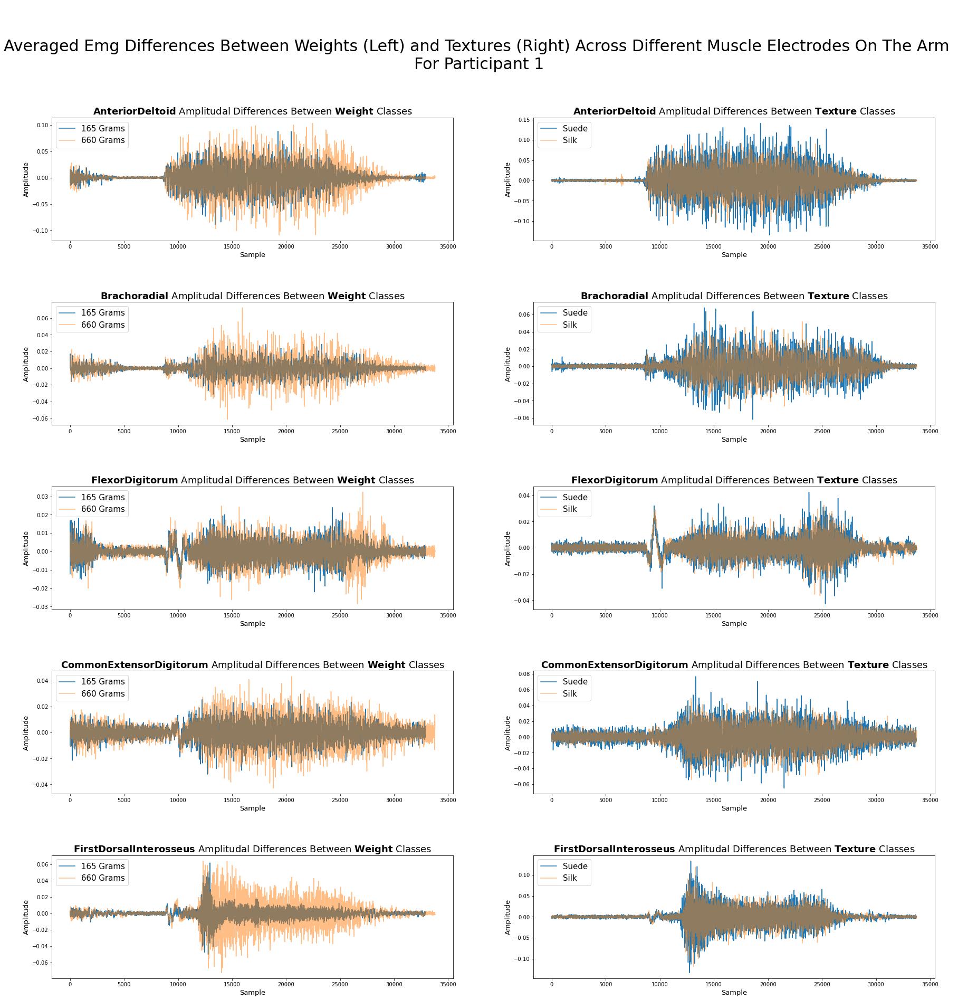

In [3]:
eeg_list,emg_list=return_eeg_emg_averages(data,'participant 1')
plot_emg_diffs(emg_list, 1)

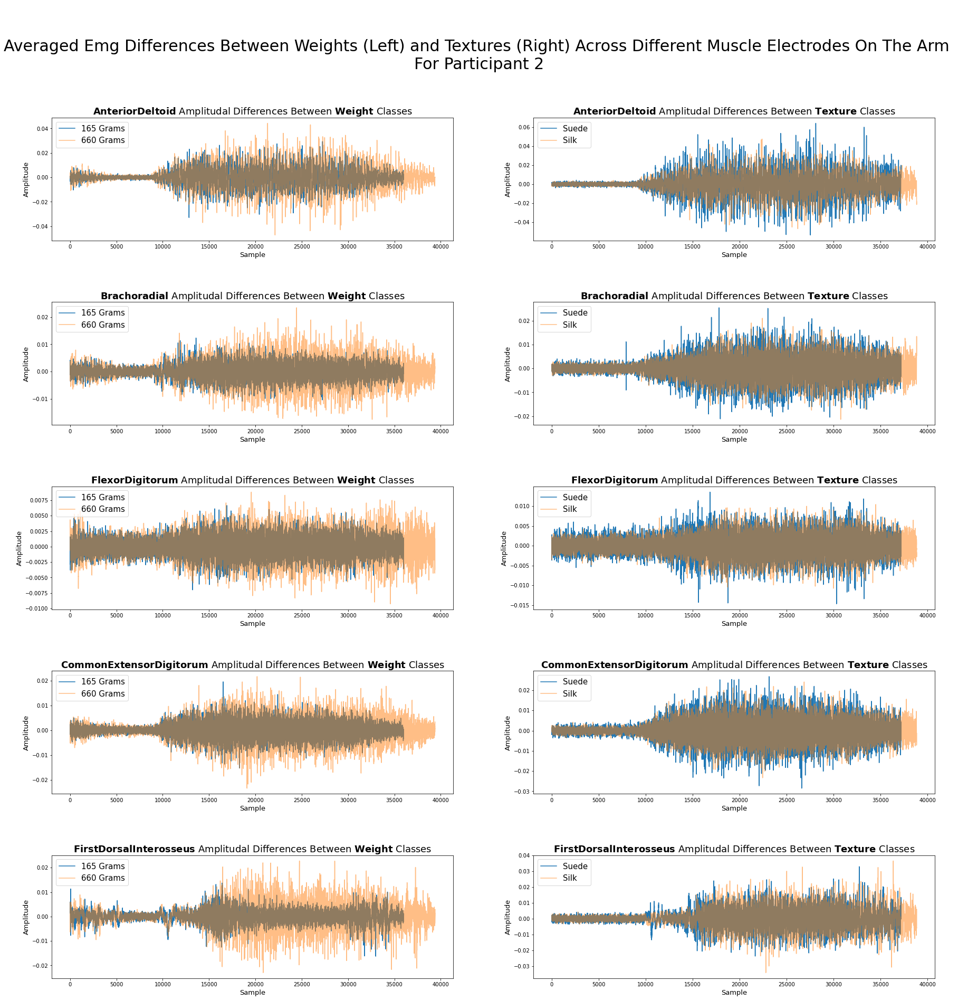

In [4]:
eeg_list,emg_list=return_eeg_emg_averages(data,'participant 2')
plot_emg_diffs(emg_list, 2)

EEG

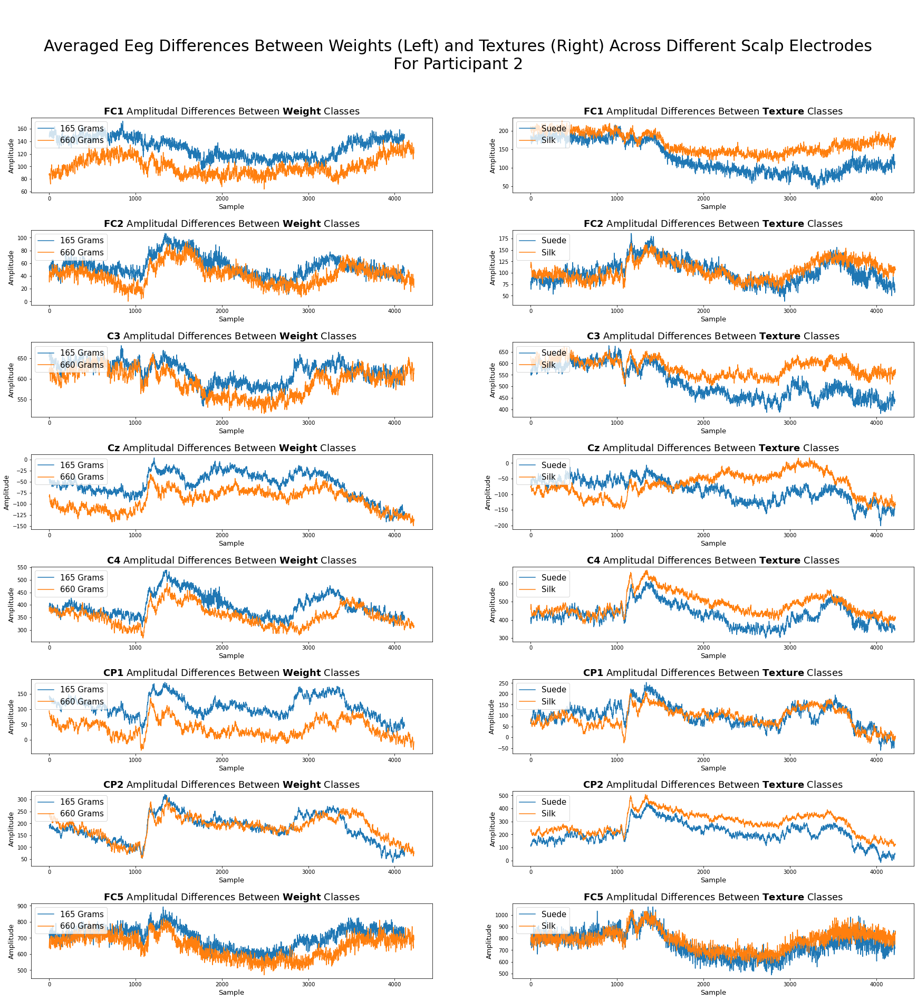

In [5]:
eeg_list,emg_list=return_eeg_emg_averages(data,'participant 1')
plot_eeg_diffs(eeg_list, 2)

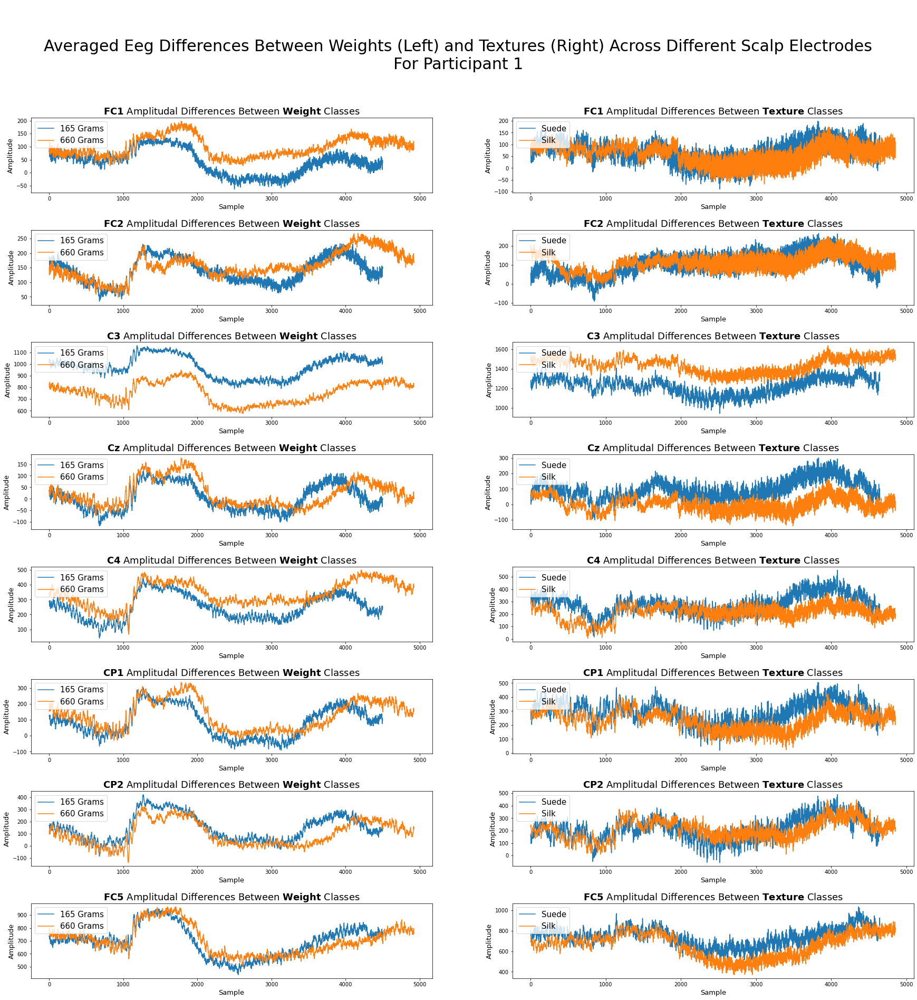

In [6]:
eeg_list,emg_list=return_eeg_emg_averages(data,'participant 2')
plot_eeg_diffs(eeg_list, 1)

Part 2: Spectrogram Analysis

In [7]:
net = AdversarialCNN(chans=37, samples=4115, n_output=2, n_nuisance=2, architecture='EEGNet')
net.temp.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 37, 4115, 8)       256       
_________________________________________________________________
batch_normalization (BatchNo (None, 37, 4115, 8)       32        
_________________________________________________________________
depthwise_conv2d (DepthwiseC (None, 1, 4115, 16)       592       
_________________________________________________________________
batch_normalization_1 (Batch (None, 1, 4115, 16)       64        
_________________________________________________________________
activation (Activation)      (None, 1, 4115, 16)       0         
_________________________________________________________________
average_pooling2d (AveragePo (None, 1, 1028, 16)       0         
_________________________________________________________________
dropout (Dropout)            (None, 1, 1028, 16)       0

## Results

In [8]:
weight_df_test_acc, weight_df_test_loss, weight_df_train_acc, weight_df_train_loss, texture_df_test_acc, texture_df_test_loss, texture_df_train_acc, texture_df_train_loss = organize_NN_results()

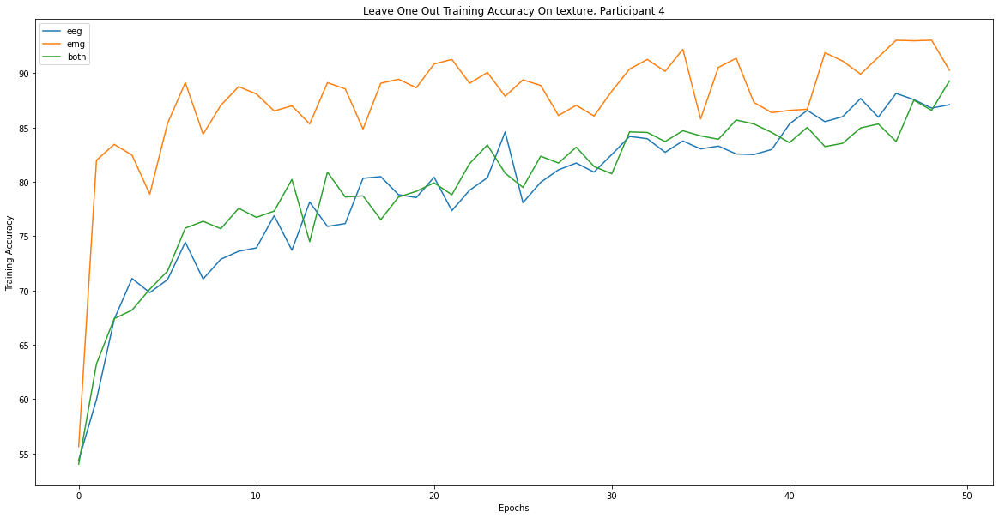

In [9]:
plot_training_accuracy('loo_4', type='texture', dframe=texture_df_train_acc)

In [12]:
plot_testing_accuracy_reg('loo_4', type='texture', dframe=texture_df_test_acc)

ValueError: too many values to unpack (expected 2)

## Discussion